In [14]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_classification
import cv2
import os

# Various attempts to extract submiages from an image

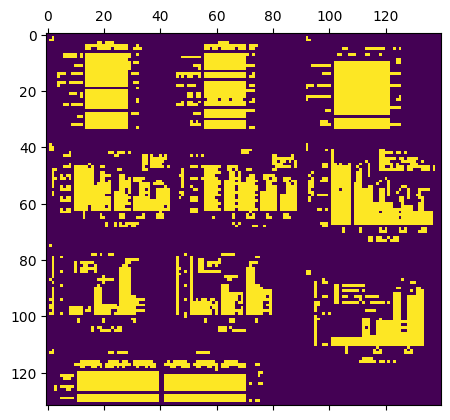

In [2]:
# Load the image
image = cv2.imread('../data/raw/sources/85.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Calculate the new width and height
width = image.shape[1] // 10
height = image.shape[0] // 10

# Resize the image
img = cv2.resize(image, (width, height))
plt.matshow(img<250)

In [4]:
x, y = np.where(img<250)
X_1 = np.vstack((x,y)).T
x, y = np.where(img>250)
X_0 = np.vstack((x,y)).T

y = np.hstack((np.ones(X_1.shape[0]), np.zeros(X_0.shape[0])))
X = np.vstack((X_1, X_0))

In [5]:
# Train the decision tree classifier
clf = DecisionTreeClassifier(criterion='entropy', max_depth=5)
clf.fit(X, y)

# Plot the decision boundary
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02), np.arange(y_min, y_max, 0.02))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

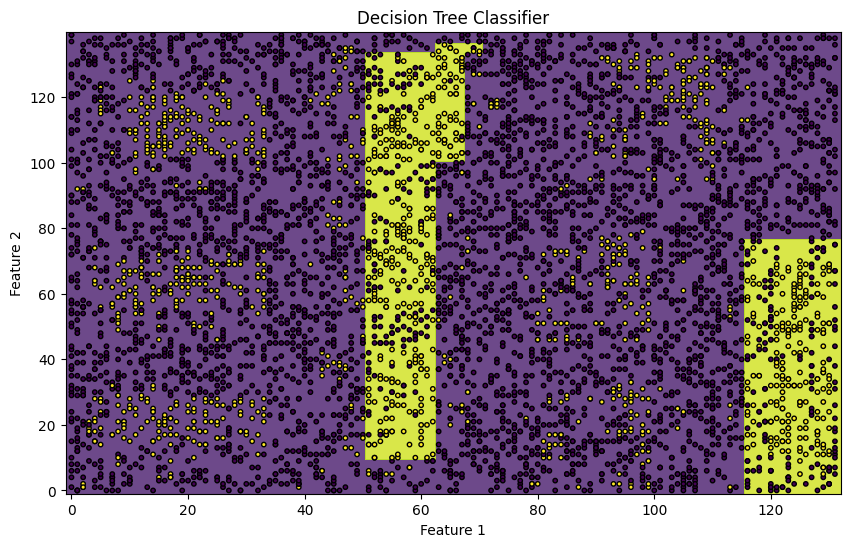

In [6]:
plt.figure(figsize=(10, 6))
plt.contourf(xx, yy, Z, alpha=0.8)
rr = np.random.randint(X.shape[0], size=5500)
plt.scatter(X[rr, 0], X[rr, 1], c=y[rr],edgecolors='k', s=10)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Tree Classifier')
plt.show()

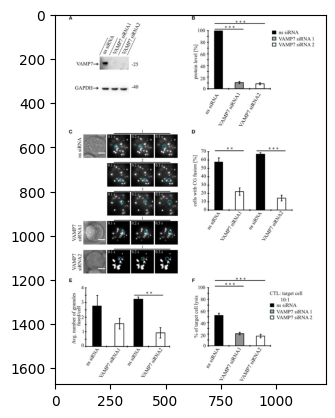

In [8]:
img = cv2.imread('../data/raw/sources/15.png')
plt.imshow(img)

19 subimages found.


/var/folders/6q/lfqcc49d7z1dd68wmncp6ccc0000gn/T/ipykernel_65533/385305576.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


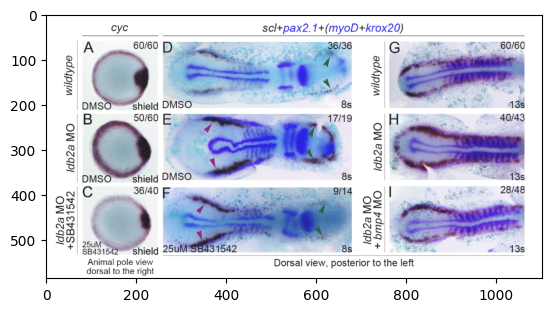

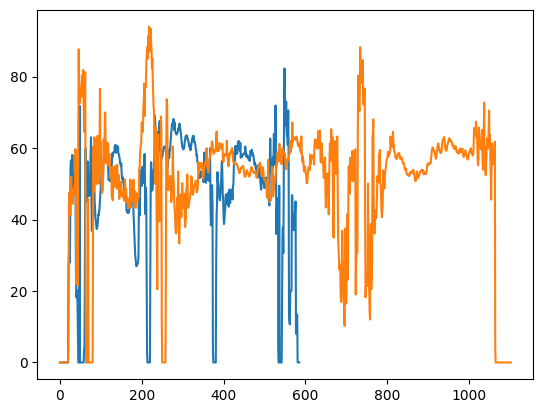

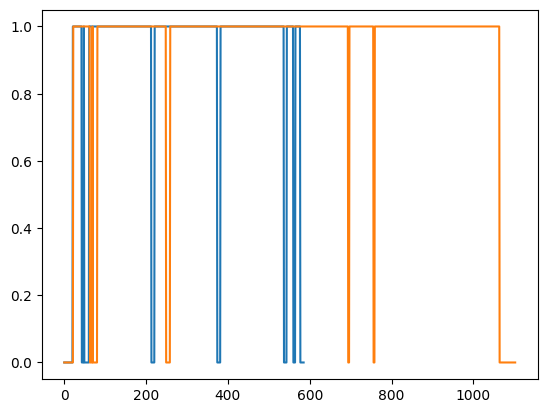

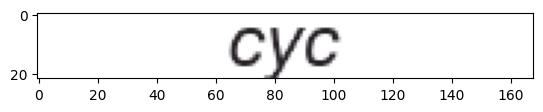

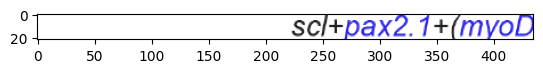

...

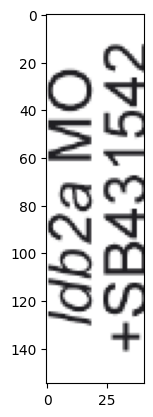

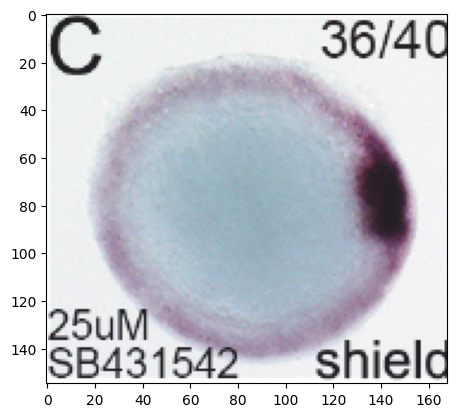

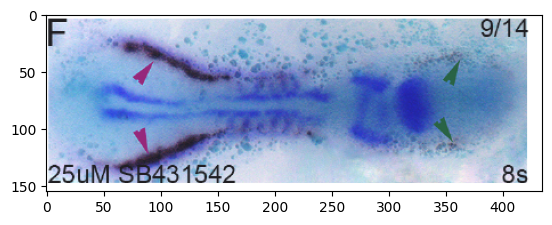

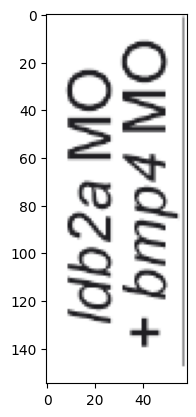

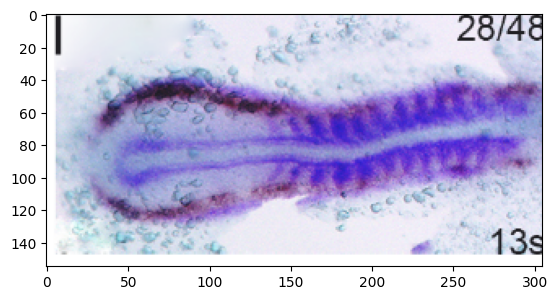

In [12]:
import cv2
import numpy as np
from skimage.morphology import binary_closing
import matplotlib.pyplot as plt

def extract_from_table(image, std_thr, kernel_x, kernel_y):
    # Threshold on mean standard deviation in x and y direction
    std_x = np.mean(np.std(image, axis=1), axis=1)
    plt.figure()
    plt.plot(std_x)
    std_y = np.mean(np.std(image, axis=0), axis=1)
    plt.plot(std_y)
    
    # Binary closing to close small whitespaces, e.g. around captions
    std_xx = binary_closing(std_x > std_thr , np.ones(kernel_x))
    std_yy = binary_closing(std_y > std_thr, np.ones(kernel_y))
    plt.figure()
    plt.plot(std_xx)
    plt.plot(std_yy)
    
    # Find start and stop positions of each subimage
    start_y = np.where(np.diff(np.int8(std_xx)) == 1)[0]
    stop_y = np.where(np.diff(np.int8(std_xx)) == -1)[0]
    start_x = np.where(np.diff(np.int8(std_yy)) == 1)[0]
    stop_x = np.where(np.diff(np.int8(std_yy)) == -1)[0]

    subimages = []
    # Extract subimages
    for y1, y2 in zip(start_y, stop_y):
        for x1, x2 in zip(start_x, stop_x):
            subimg = image[y1:y2, x1:x2, :]
            if not (subimg.shape[0]<20 or subimg.shape[1]<20 or np.std(subimg)<10):
                subimages.append(subimg)
    return subimages


img = cv2.imread('../data/raw/sources/76.png')
plt.figure()
plt.imshow(img)
subimages = extract_from_table(img, 20, 3,3)
print('{} subimages found.'.format(len(subimages)))
for i in subimages:
    plt.figure()
    plt.imshow(i)

../data/raw/sources/0.png
../data/raw/sources/1.png
../data/raw/sources/10.png
../data/raw/sources/100.png
../data/raw/sources/101.png
../data/raw/sources/102.png
../data/raw/sources/11.png
../data/raw/sources/12.png
../data/raw/sources/13.png
../data/raw/sources/14.png
../data/raw/sources/15.png
../data/raw/sources/16.png
../data/raw/sources/17.png


/var/folders/6q/lfqcc49d7z1dd68wmncp6ccc0000gn/T/ipykernel_65533/385305576.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


../data/raw/sources/18.png
../data/raw/sources/19.png
../data/raw/sources/2.png
../data/raw/sources/20.png
../data/raw/sources/21.png
../data/raw/sources/22.png
../data/raw/sources/23.png
../data/raw/sources/24.png
../data/raw/sources/25.png
../data/raw/sources/26.png
../data/raw/sources/27.png
../data/raw/sources/28.png
../data/raw/sources/29.png
../data/raw/sources/3.png
../data/raw/sources/30.png
../data/raw/sources/31.png
../data/raw/sources/32.png
../data/raw/sources/33.png
../data/raw/sources/34.png
../data/raw/sources/35.png
../data/raw/sources/36.png
../data/raw/sources/37.png
../data/raw/sources/38.png
../data/raw/sources/39.png
../data/raw/sources/4.png
../data/raw/sources/40.png
../data/raw/sources/41.png
../data/raw/sources/42.png
../data/raw/sources/43.png
../data/raw/sources/44.png
../data/raw/sources/45.png
../data/raw/sources/46.png
../data/raw/sources/47.png
../data/raw/sources/48.png
../data/raw/sources/49.png
../data/raw/sources/5.png
../data/raw/sources/50.png
../da

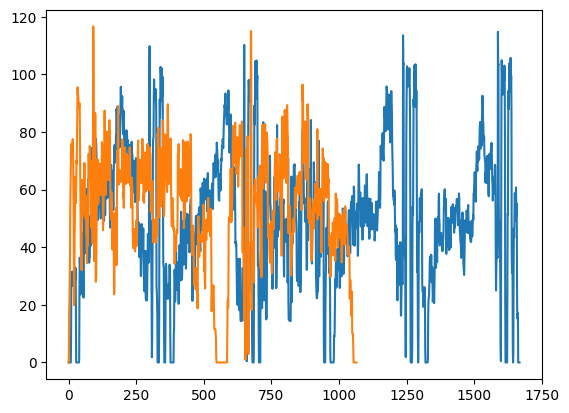

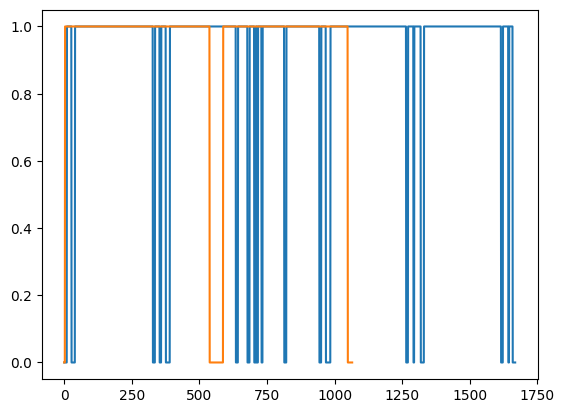

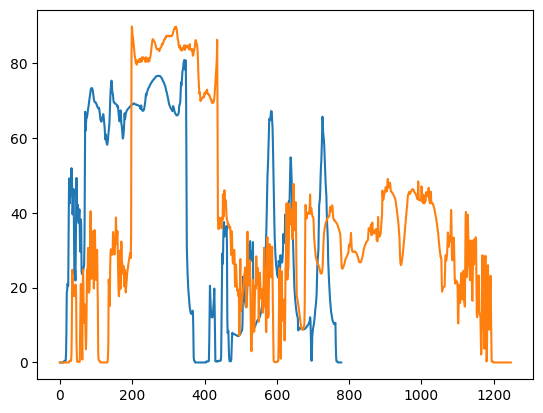

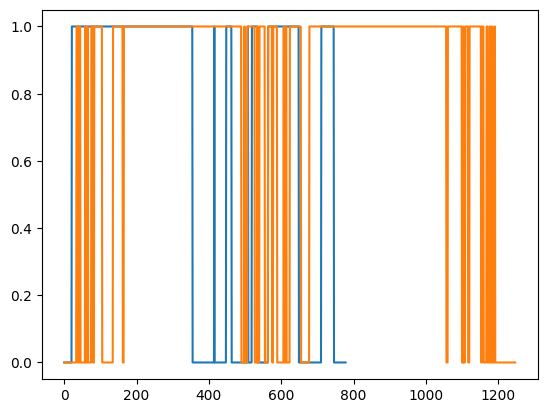

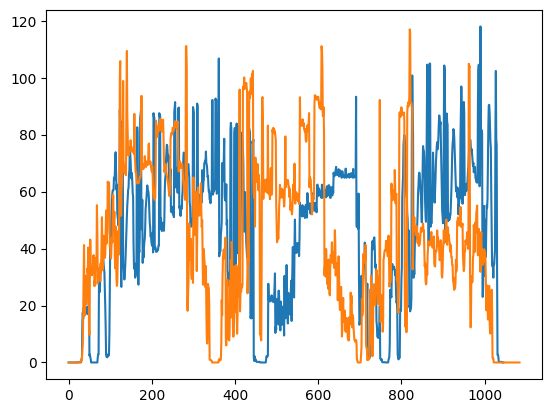

...

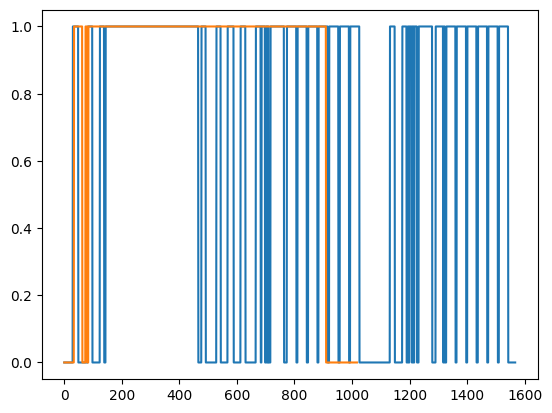

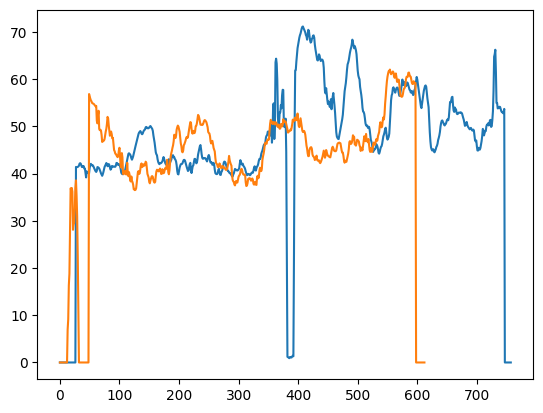

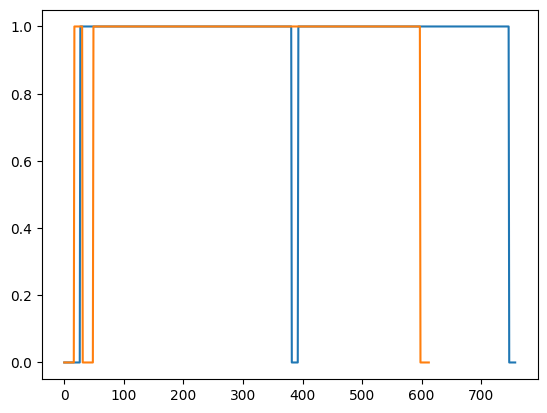

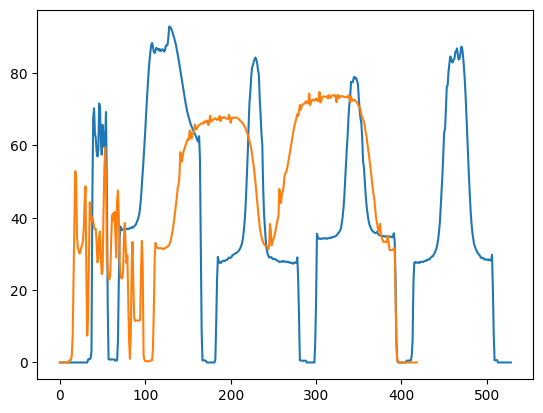

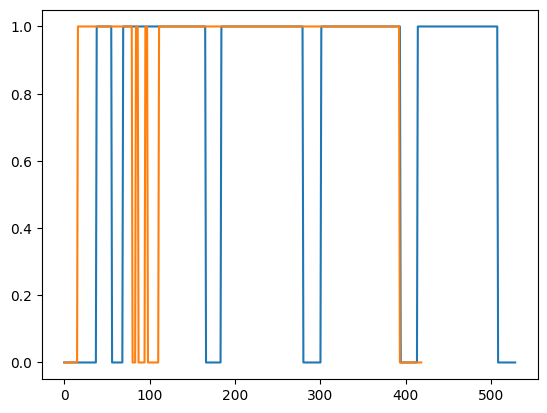

In [15]:
def get_file_list(root_dir):
    extensions = ['.jpg', '.JPG', '.jpeg', '.JPEG', '.png', '.PNG']
    file_list = []
    counter = 1
    for root, directories, filenames in os.walk(root_dir):
        for filename in filenames:
            if any(ext in filename for ext in extensions):
                file_list.append(os.path.join(root, filename))
                counter += 1
    return file_list

# path to the datasets
root_dir = '../data/raw/sources/'
filenames = sorted(get_file_list(root_dir))
len(filenames)

# Loop over filenames
for file in filenames:
    # Create a folder for the current file
    folder_name = "../data/preprocessed/sub_imgs_of_" + os.path.splitext(file)[0]  # Use filename without extension as folder name
    os.makedirs(folder_name, exist_ok=True)  # Create folder if it doesn't exist
    print(file)
    img = cv2.imread(file)
    # Generate file using the g() function
    subimages = extract_from_table(img, 20, 3,3)

    for n, i in enumerate(subimages):
        # Save the generated file in the respective folder
        cv2.imwrite(folder_name + '/subimg_'+ str(n)+'.png', i)